In [1]:
import numpy as np
from datetime import datetime 

import matplotlib.pyplot as plt
import seaborn as sns
from shapely import box, Polygon
import xarray as xr
import rioxarray as rio
import seaborn as sns
sns.set_theme()
import pandas as pd
pd.set_option('display.precision', 2)

from pathlib import Path

import math

# ====== import my own functions =========
import sys
import os
project_root = str(Path(os.getcwd()).parent)

if project_root not in sys.path:
    sys.path.append(project_root)

%load_ext autoreload
%autoreload 2
# from scripts.layers import assemble_data, get_uavsar_coherence, get_uavsar_incidence, get_nlcd_layers
from scripts.layers import *

/bsuhome/julialober/miniforge3/envs/coherence_v2/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
data_dir = '/bsuhome/julialober/scratch/coherence_data/'
slc = xr.open_zarr(data_dir + 'stacks/slc_box_south_1x1')
slc = slc.sel(flight_id='27129')
print(slc)

<xarray.Dataset> Size: 61MB
Dimensions:          (y: 616, x: 827, pol: 4, pair: 6)
Coordinates:
  * y                (y) float64 5kB 40.6 40.6 40.6 40.6 ... 40.52 40.52 40.52
  * x                (x) float64 7kB -111.7 -111.7 -111.7 ... -111.6 -111.6
  * pol              (pol) <U2 32B 'VV' 'HH' 'VH' 'HV'
  * pair             (pair) <U13 312B '200213_200221' ... '210316_210322'
    band             int64 8B ...
    flight_id        <U5 20B '27129'
    spatial_ref      int64 8B ...
Data variables:
    canopy_2019      (y, x) float32 2MB dask.array<chunksize=(154, 414), meta=np.ndarray>
    coherence        (pol, pair, y, x) float32 49MB dask.array<chunksize=(1, 2, 308, 414), meta=np.ndarray>
    cover_2019       (y, x) float64 4MB dask.array<chunksize=(154, 414), meta=np.ndarray>
    elevation        (y, x) float32 2MB dask.array<chunksize=(154, 414), meta=np.ndarray>
    incidence_angle  (y, x) float64 4MB dask.array<chunksize=(154, 414), meta=np.ndarray>


## Load the rest of the window sizes of coherence

In [3]:
data_dir = '/bsuhome/julialober/scratch/coherence_data/'
file_info = pd.read_parquet(data_dir + 'coherence_files_overview.parquet')
file_info

,filename,file_type,flight_path,flight_num,date_reference,date_secondary,polarization,segment,absolute_path
0,uticam_21003_21004_002_210120_L090VV_01_BC.ann,ann_slc,uticam,21003,210120,NaN,NaN,NaN,/bsuhome/julialober/scratch/coherence_data/uav...
1,uticam_21003_21002_003_210115_L090VH_01_BC.ann,ann_slc,uticam,21003,210115,NaN,NaN,NaN,/bsuhome/julialober/scratch/coherence_data/uav...
2,uticam_21003_21013_003_210223_L090VH_01_BC.ann,ann_slc,uticam,21003,210223,NaN,NaN,NaN,/bsuhome/julialober/scratch/coherence_data/uav...
3,uticam_21003_21013_003_210223_L090VV_01_BC_s2_...,raw_slc,uticam,21003,210223,NaN,NaN,s2,/bsuhome/julialober/scratch/coherence_data/uav...
4,uticam_21003_21013_003_210223_L090VV_01_BC_s1_...,raw_slc,uticam,21003,210223,NaN,NaN,s1,/bsuhome/julialober/scratch/coherence_data/uav...
...,...,...,...,...,...,...,...,...,...
3789,lowman_23205_210115_210210_VV_s2_w5_int_coh.tif,int_pair,lowman,23205,210115,210210,VV,s2,/bsuhome/julialober/scratch/coherence_data/uav...
3790,lowman_23205_210120_HV-VH_s1_w5_crosspol_coh.tif,crosspol,lowman,23205,210120,NaN,HV-VH,s1,/bsuhome/julialober/scratch/coherence_data/uav...
3791,lowman_23205_210115_210127_VV_s2_w5_int_coh.tif,int_pair,lowman,23205,210115,210127,VV,s2,/bsuhome/julialober/scratch/coherence_data/uav...
3792,lowman_23205_200221_210127_HH_s1_w13_int_coh.tif,int_pair,lowman,23205,200221,210127,HH,s1,/bsuhome/julialober/scratch/coherence_data/uav...


In [4]:
meta = file_info[file_info['flight_path'] == 'stlake']
# meta = meta[meta['flight_num'] == '32109'] # this is the only path useful for my chosen site
summary_df = meta.pivot_table(index=['flight_path', 'flight_num'], 
                                columns='file_type', 
                                aggfunc='size', 
                                fill_value=0)
display(summary_df.join(meta.groupby(['flight_path', 'flight_num'])[['polarization', 'segment']].nunique().add_prefix('unique_')))

,,ann_slc,crosspol,geo_slc,int_pair,lkv,llh,raw_slc,unique_polarization,unique_segment
flight_path,flight_num,,,,,,,,,
stlake,27129,44,11,44,110,1,1,44,3,1


In [5]:
POL = 'VV'
int_pairs = meta[meta['file_type'] == 'int_pair']
int_pairs = int_pairs[int_pairs['polarization'] == POL]
print(f'Using only {POL} polarization.')

# get flight ids 
flight_ids = meta['flight_num'].unique()
print(f'Flight numbers: {flight_ids}')

# get all date pairs 
date_pairs_int = list(zip(int_pairs['date_reference'], int_pairs['date_secondary']))
dates = [
    "200213", "200221",
    "210203", "210210",
    "210223", "210303",
    "210303", "210310",
    "210310", "210316",
    "210316", "210322",
]
date_pairs_int = list(zip(dates[::2], dates[1::2]))
print(date_pairs_int)
dates = [(f"20{date[0]}", f"20{date[1]}") for date in date_pairs_int]
print(f'Number of date pairs: {len(dates)}')

# get bounding box 
filenames = [int_pairs[int_pairs['flight_num'] == f]['absolute_path'].iloc[0] for f in flight_ids]
all_bounds = [rasterio.open(f).bounds for f in filenames]
aoi = box(
    min(b[0] for b in all_bounds), # min left
    min(b[1] for b in all_bounds), # min bottom
    max(b[2] for b in all_bounds), # max right
    max(b[3] for b in all_bounds)  # max top
)

aoi = box(-111.72, 40.5202, -111.615, 40.5984)

# Create the 2D Polygon
# aoi = Polygon(coords)

print(f'AOI bounding box: {aoi}')

Using only VV polarization.
Flight numbers: <ArrowStringArray>
['27129']
Length: 1, dtype: str
[('200213', '200221'), ('210203', '210210'), ('210223', '210303'), ('210303', '210310'), ('210310', '210316'), ('210316', '210322')]
Number of date pairs: 6
AOI bounding box: POLYGON ((-111.615 40.5202, -111.615 40.5984, -111.72 40.5984, -111.72 40.5202, -111.615 40.5202))


In [6]:
METRES_PER_DEGREE_AT_45_LAT: float = 111320.0 * math.cos(math.radians(45.0))
res = 10
res_grid = res / METRES_PER_DEGREE_AT_45_LAT
ref_grid = make_reference_grid(aoi=aoi, crs='EPSG:4326', resolution=res_grid)

In [7]:
windows = ['3x5', '7x10', '14x20', '40x40', '60x60', '80x80', '100x100', '133x133']

In [8]:
slc.drop_vars('coherence')

<xarray.Dataset> Size: 12MB
Dimensions:          (y: 616, x: 827, pair: 6, pol: 4)
Coordinates:
  * y                (y) float64 5kB 40.6 40.6 40.6 40.6 ... 40.52 40.52 40.52
  * x                (x) float64 7kB -111.7 -111.7 -111.7 ... -111.6 -111.6
  * pair             (pair) <U13 312B '200213_200221' ... '210316_210322'
  * pol              (pol) <U2 32B 'VV' 'HH' 'VH' 'HV'
    band             int64 8B ...
    flight_id        <U5 20B '27129'
    spatial_ref      int64 8B ...
Data variables:
    canopy_2019      (y, x) float32 2MB dask.array<chunksize=(154, 414), meta=np.ndarray>
    cover_2019       (y, x) float64 4MB dask.array<chunksize=(154, 414), meta=np.ndarray>
    elevation        (y, x) float32 2MB dask.array<chunksize=(154, 414), meta=np.ndarray>
    incidence_angle  (y, x) float64 4MB dask.array<chunksize=(154, 414), meta=np.ndarray>

In [9]:
cohs = {}
for w in windows: 
    c = get_uavsar_coherence(
        tile_aoi=aoi,
        date_pairs=validate_date_pairs(dates),
        flight_ids=flight_ids,
        crs='EPSG:4326',
        tile_ref_grid=ref_grid,
        fp=data_dir + 'uavsar_cohs_cropped/stlake/',
        verbose=True,
        win=w
    )
    cohs[w] = c
    print(f'Got {w}')

Got 3x5
Got 7x10


KeyboardInterrupt: 

In [ ]:
print(cohs)

{'3x5': <xarray.Dataset> Size: 12MB
Dimensions:      (flight_id: 1, pol: 1, pair: 6, y: 616, x: 827)
Coordinates:
  * flight_id    (flight_id) StringDType(na_object=nan) 16B '27129'
  * pol          (pol) <U2 8B 'VV'
  * pair         (pair) <U13 312B '200213_200221' ... '210316_210322'
  * y            (y) float64 5kB 40.6 40.6 40.6 40.6 ... 40.52 40.52 40.52 40.52
  * x            (x) float64 7kB -111.7 -111.7 -111.7 ... -111.6 -111.6 -111.6
    spatial_ref  int64 8B 0
Data variables:
    coherence    (flight_id, pol, pair, y, x) float32 12MB 0.6184 ... 0.4028, '7x10': <xarray.Dataset> Size: 12MB
Dimensions:      (flight_id: 1, pol: 1, pair: 6, y: 616, x: 827)
Coordinates:
  * flight_id    (flight_id) StringDType(na_object=nan) 16B '27129'
  * pol          (pol) <U2 8B 'VV'
  * pair         (pair) <U13 312B '200213_200221' ... '210316_210322'
  * y            (y) float64 5kB 40.6 40.6 40.6 40.6 ... 40.52 40.52 40.52 40.52
  * x            (x) float64 7kB -111.7 -111.7 -111.7 ... -111.

In [ ]:
comb = xr.concat(
    list(cohs.values()),
    dim=pd.Index(list(cohs.keys()), name="window_size"),
)
slc['coherence'] = comb['coherence']
print(slc)

<xarray.Dataset> Size: 403MB
Dimensions:          (pair: 6, pol: 4, x: 827, y: 616, flight_id: 1,
                      window_size: 8)
Coordinates:
  * pair             (pair) <U13 312B '200213_200221' ... '210316_210322'
  * pol              (pol) <U2 32B 'VV' 'HH' 'VH' 'HV'
  * x                (x) float64 7kB -111.7 -111.7 -111.7 ... -111.6 -111.6
  * y                (y) float64 5kB 40.6 40.6 40.6 40.6 ... 40.52 40.52 40.52
  * flight_id        (flight_id) StringDType(na_object=nan) 16B '27129'
  * window_size      (window_size) StringDType(na_object=nan) 128B '3x5' ... ...
    band             int64 8B ...
    spatial_ref      int64 8B ...
Data variables:
    canopy_2019      (y, x) float32 2MB dask.array<chunksize=(154, 414), meta=np.ndarray>
    coherence        (window_size, flight_id, pol, pair, y, x) float32 391MB ...
    cover_2019       (y, x) float64 4MB dask.array<chunksize=(154, 414), meta=np.ndarray>
    elevation        (y, x) float32 2MB dask.array<chunksize=(154, 41

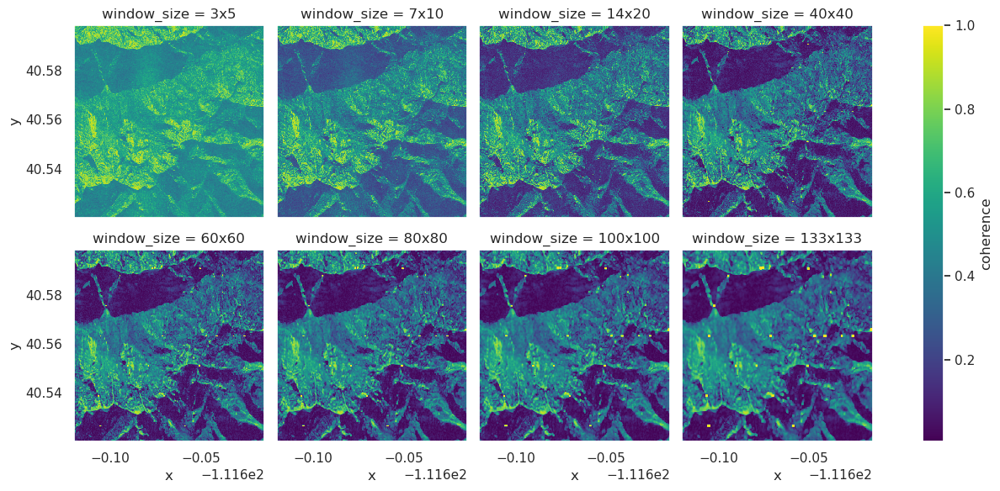

In [ ]:
slc['coherence'].sel(flight_id='27129', pair='210203_210210', pol='VV').plot(col='window_size', col_wrap=4)

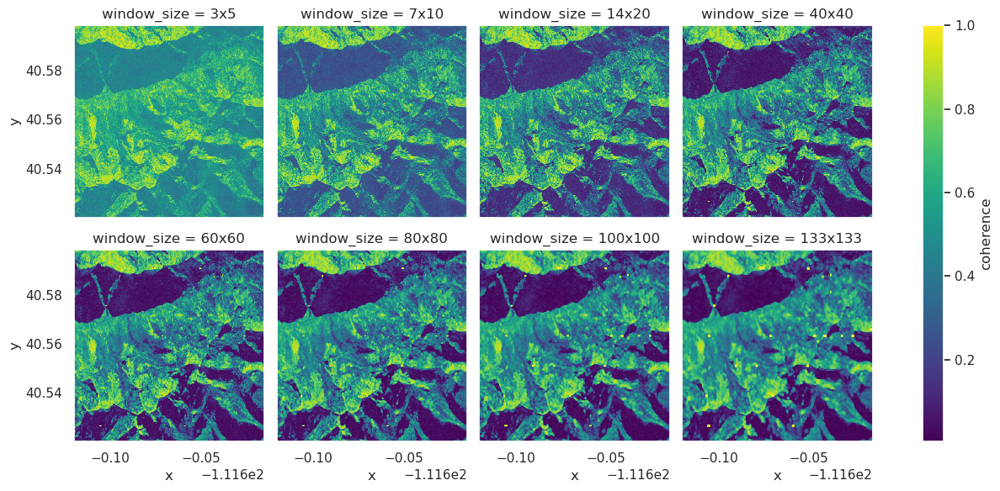

In [ ]:
slc['coherence'].sel(flight_id='27129', pair='210303_210310', pol='VV').plot(col='window_size', col_wrap=4)

## Filter 

In [10]:
slc = xr.open_zarr(data_dir + 'stacks/slc_all_window_sizes')

In [11]:
inc_cutoff = 80
canopy_cutoff = 40
elev_quant = 60
xpol_cutoff = 0.8

def filter_data(data) : 
    single_year_pairs = [
        p for p in data.coords['pair'].values 
        if p[:2] == p[7:9]
    ]

    print(f'Filtering for {len(single_year_pairs)} single-year pairs.')
    data = data.sel(pair=single_year_pairs)

    print(f'Trimming to DEM.')
    data = data.where(data['elevation'].notnull())

    print(f'Filtering inc angle > {inc_cutoff}, canopy cover > {canopy_cutoff}, elev top {elev_quant}%.')
    condition = (data['incidence_angle'] < inc_cutoff) & \
                (data['canopy_2019'] < canopy_cutoff) & \
                (data['elevation'] > data['elevation'].quantile((100-elev_quant)/100))

    data = data.where(condition)

    return data

def filter_and_plot_pairs(
    dataset: xr.Dataset, 
    coh_dir: Path, 
    cutoff: float,
    pol: str = 'VV',
) -> xr.Dataset:
    """
    Pre-loads cross-pol coherences, applies a cutoff mask to reference and secondary
    flights, plots a 3-panel figure per pair, and returns the filtered dataset.
    
    Args:
        dataset: The target InSAR xarray.Dataset (e.g., rmnp_good).
        coh_dir: Pathlib object pointing to the directory of cross-pol tif files.
        cutoff: The cross-pol coherence threshold to apply to the mask.
        
    Returns:
        A fully masked xarray.Dataset concatenated back along the 'pair' dimension.
    """
    
    # 1. Extract unique dates to avoid redundant loading
    all_pairs: List[str] = dataset['pair'].values.tolist()
    unique_dates: Set[str] = set()
    for pair_name in all_pairs:
        # Utilizing character slicing as determined in our previous session
        unique_dates.add(pair_name[:6])  
        unique_dates.add(pair_name[7:13]) 

    # print(unique_dates)
        
    # 2. Pre-load all unique cross-pol rasters into a single datacube
    xpol_list: List[xr.DataArray] = []
    valid_dates: List[str] = []
    
    
    for date_str in sorted(list(unique_dates)):
        file_path_list = list(coh_dir.glob(f"*{date_str}*_crosspol_coh.tif"))
        # print(file_path_list)
        
        try:
            # Enforce API safety / File loader robustness
            if not file_path_list:
                raise FileNotFoundError(f"Missing cross-pol raster for date: {date_str}")
            
            # Squeeze band, assign the date as a coordinate, and append
            da = rio.open_rasterio(file_path_list[0]).squeeze('band', drop=True)
            da = da.assign_coords(date=date_str)
            xpol_list.append(da)
            valid_dates.append(date_str)
            
        except Exception as e:
            print(f"[ERROR] Failed to load cross-pol data for {date_str}: {e}")
            continue
            
    # Combine into a single cube and reproject ONCE to match target grid
    print(f"Reprojecting cross-pol datacube for {len(valid_dates)} unique flights...")
    xpol_cube = xr.concat(xpol_list, dim='date')
    xpol_cube = xpol_cube.rio.write_crs('EPSG:4326')
    xpol_cube = xpol_cube.rio.reproject_match(dataset[['y', 'x']])
    
    # 3. Iterate through pairs to mask and plot
    filtered_subsets: List[xr.Dataset] = []
    
    for pair_name in all_pairs:
        ref_date = pair_name[:6]
        sec_date = pair_name[7:13]
        
        # Fast in-memory selection
        xpol_ref = xpol_cube.sel(date=ref_date)
        xpol_sec = xpol_cube.sel(date=sec_date)
        
        # Calculate mask: both reference AND secondary flights must exceed cutoff
        crosspol_mask = ((xpol_ref >= cutoff) & (xpol_sec >= cutoff))
        
        # Isolate the specific pair while retaining the 'pair' dimension
        target_pair = dataset.sel(pair=[pair_name])
        
        # Safely handle NoData / apply mask
        filtered_pair = target_pair.where(crosspol_mask)
        filtered_subsets.append(filtered_pair)
        
        # --- Plotting Subroutine ---
        fig, axes = plt.subplots(1, 4, figsize=(22, 5))
    
        target_pair['coherence'].sel(pol=pol, window_size='7x10').plot(ax=axes[0], cmap='inferno', vmin=0, vmax=1, cbar_kwargs={'shrink': 0.7})
        axes[0].set_title(f"Unmasked Interferometric Coherence\n({ref_date})")
        axes[0].set_aspect('equal')

        # Ensure we are handling spatial constants / NaN display natively via xarray plotting
        xpol_ref.plot(ax=axes[1], cmap='viridis', vmin=0, vmax=1, cbar_kwargs={'shrink': 0.7})
        axes[1].set_title(f"Reference Cross-Pol Coherence\n({ref_date})")
        axes[1].set_aspect('equal')
        
        xpol_sec.plot(ax=axes[2], cmap='viridis', vmin=0, vmax=1, cbar_kwargs={'shrink': 0.7})
        axes[2].set_title(f"Secondary Cross-Pol Coherence\n({sec_date})")
        axes[2].set_aspect('equal')
        
        # Squeeze out the 'pair' dim just for the 2D plot, plotting actual InSAR coherence
        filtered_pair['coherence'].sel(pol=pol, window_size='7x10').squeeze().plot(ax=axes[3], cmap='inferno', vmin=0, vmax=1, cbar_kwargs={'shrink': 0.7})
        axes[3].set_title(f"Masked Interferometric Coherence\n({pair_name})")
        axes[3].set_aspect('equal')
        
        plt.tight_layout()
        plt.show() # In an HPC batch script, change this to plt.savefig()
        
    # 4. Re-assemble the fully masked multidimensional dataset
    return xr.concat(filtered_subsets, dim='pair')

Reprojecting cross-pol datacube for 9 unique flights...


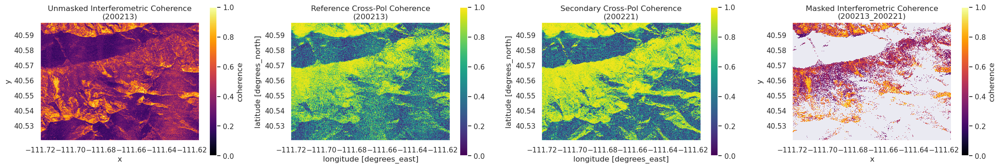

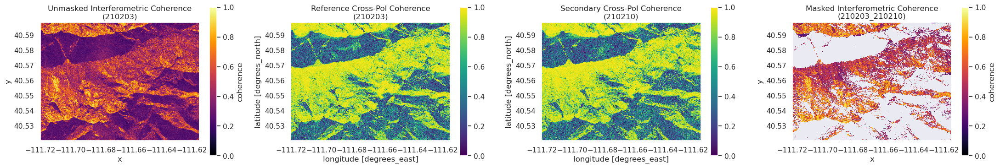

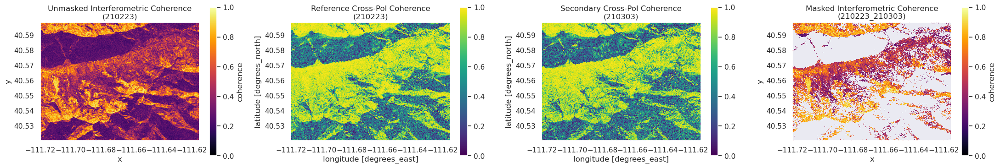

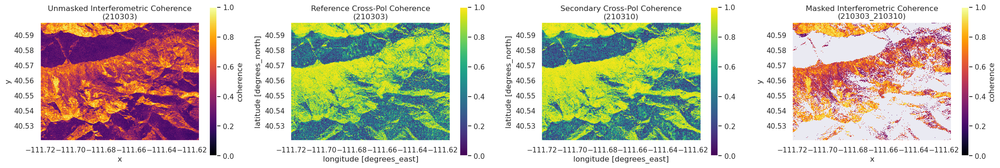

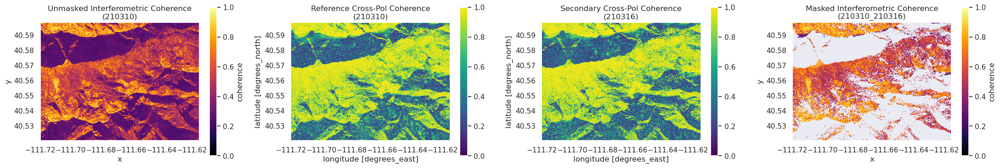

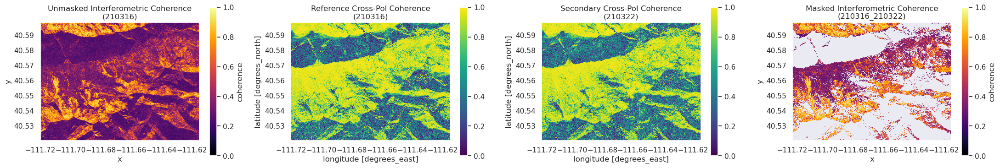

Filtering for 6 single-year pairs.
Trimming to DEM.
Filtering inc angle > 80, canopy cover > 40, elev top 60%.


/tmp/ipykernel_145518/2353135956.py:132: FutureWarning: In a future version of xarray the default value for data_vars will change from data_vars='all' to data_vars=None. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set data_vars explicitly.
  return xr.concat(filtered_subsets, dim='pair')


In [12]:
coh_dir: Path = Path(f"{data_dir}/uavsar_cohs_cropped/stlake/27129/")
slc_xpol = filter_and_plot_pairs(slc, coh_dir, xpol_cutoff)
slc_filtered = filter_data(slc_xpol)

# Compare window sizes 

In [18]:
# 1. Define the two pairs you want to compare
pair_1 = "210203_210210"
pair_2 = "210303_210310"
# pair_1 = "210316_210322"

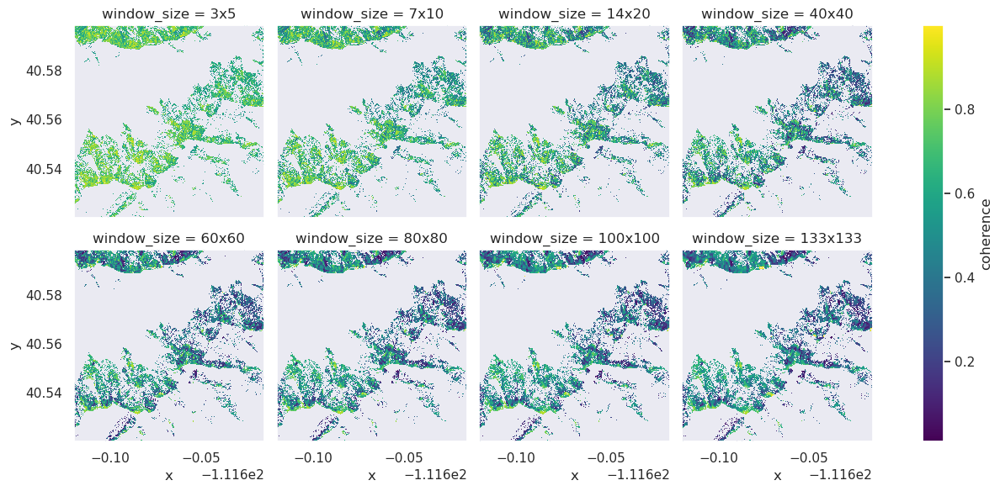

In [19]:
slc_filtered['coherence'].sel(pol='VV', pair=pair_1).plot(col='window_size', col_wrap=4)

In [20]:
slc_filtered = slc_filtered.where(slc_filtered['coherence'] < 1)
# slc_filtered = slc_filtered.clip(min=0.2)

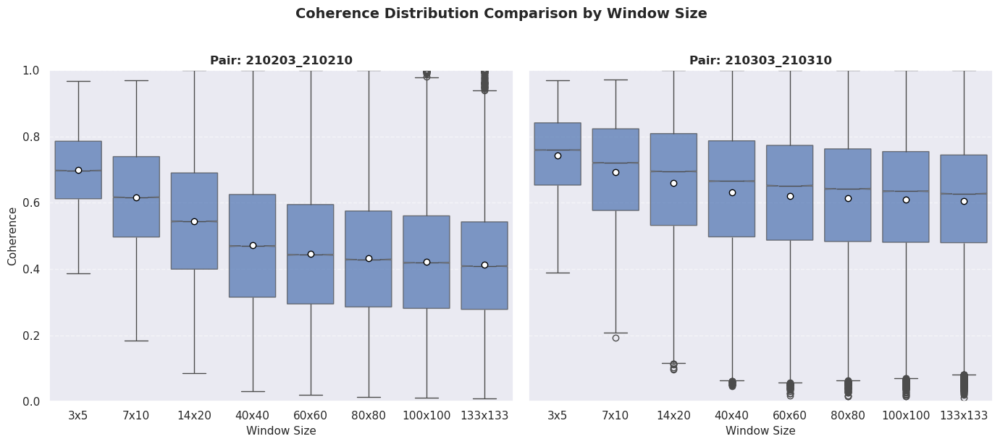

In [21]:
# 2. Select data for each pair in xarray, convert to DataFrame, and clean NaNs
df1 = (
    slc_filtered["coherence"]
    .sel(pair=pair_1, pol='VV')
    .to_dataframe()
    .reset_index()
    .dropna(subset=["coherence"])
)
df2 = (
    slc_filtered["coherence"]
    .sel(pair=pair_2, pol='VV')
    .to_dataframe()
    .reset_index()
    .dropna(subset=["coherence"])
)

# 3. Create a 1x2 subplot structure
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# Common styling dictionary for both plots
boxplot_kwargs = {
    "x": "window_size",
    "y": "coherence",
    "notch": True,
    "showmeans": True,
    "meanprops": {
        "marker": "o",
        "markerfacecolor": "white",
        "markeredgecolor": "black",
        "markersize": 6,
    },
    "boxprops": {"facecolor": "#4c72b0", "alpha": 0.7},
}

# 4. Subplot 1
sns.boxplot(data=df1, ax=axes[0], **boxplot_kwargs)
axes[0].set_title(f"Pair: {pair_1}", fontsize=12, fontweight="bold")
axes[0].set_xlabel("Window Size", fontsize=11)
axes[0].set_ylabel("Coherence", fontsize=11)
axes[0].grid(axis="y", linestyle="--", alpha=0.5)

# 5. Subplot 2
sns.boxplot(data=df2, ax=axes[1], **boxplot_kwargs)
axes[1].set_title(f"Pair: {pair_2}", fontsize=12, fontweight="bold")
axes[1].set_xlabel("Window Size", fontsize=11)
axes[1].set_ylabel("")  # Hide duplicate y-axis label since sharey=True
axes[1].grid(axis="y", linestyle="--", alpha=0.5)

# Set y-limits across both subplots
axes[0].set_ylim(0, 1)

plt.suptitle(
    "Coherence Distribution Comparison by Window Size",
    fontsize=14,
    fontweight="bold",
    y=1.02,
)
plt.tight_layout()
plt.show()

In [22]:
# slc.to_zarr(data_dir + 'stacks/slc_all_window_sizes', mode='w', consolidated=True)